# GPU vs CPU compression
A small notebook to compare if there are differences when compressing samples with the CPU or GPU using JPEG-AI.

## Libraries import

In [1]:
import numpy as np
import os
import glob
import sys
import matplotlib.pyplot as plt
import pandas as pd
sys.path.append('/nas/home/ecannas/third_party_code/jpeg-ai-reference-software')
from PIL import Image
import torch
from src.codec.metrics.metrics import DataClass, MetricsProcessor, MetricsFabric
from tqdm.notebook import tqdm
import argparse

## Helpers

In [15]:
# Prepare the metrics processor
metrics = MetricsProcessor()
metrics.internal_bits = 10
metrics.jvet_psnr = False
metrics.metrics = MetricsFabric.metrics_list
metrics.metrics_output = [metric for metric in MetricsFabric.metrics_list]
metrics.color_conv = '709'
metrics.max_samples_for_eval_on_gpu = -1
gpu = 5
os.environ["CUDA_VISIBLE_DEVICES"] = str(gpu)

## Execution parameters

### ImageNet

In [2]:
rec_image_dir = '/nas/public/exchange/JPEG-AI/data/TEST/CPU_vs_GPU/imagenet'
or_image_dir = '/nas/public/exchange/JPEG-AI/data/TEST/imagenet/original'

In [22]:
# --- Create a dataframe for all info
all_dfs = []
all_target_bpps = os.listdir(os.path.join(rec_image_dir, 'compressed_CPU'))[2:]

# --- Find GPU-compressed samples
gpu_df = []
for target_bpp in all_target_bpps:
    all_bpp_images = glob.glob(os.path.join(rec_image_dir, 'compressed_GPU', target_bpp, '*.png'))
    print(f'We have {len(all_bpp_images)} for {target_bpp}')
    df = pd.DataFrame(all_bpp_images, columns=['path'])
    df = pd.concat({target_bpp: df}, names=['Target BPP'])
    df['filename'] = df['path'].apply(lambda x: os.path.basename(x))
    gpu_df.append(df)
gpu_df = pd.concat(gpu_df)
all_dfs.append(pd.concat({'GPU compression': gpu_df}, names=['Device']))

# --- Find CPU-compressed samples
cpu_df = []
for target_bpp in all_target_bpps:
    all_bpp_images = glob.glob(os.path.join(rec_image_dir, 'compressed_CPU', target_bpp, '*.png'))
    print(f'We have {len(all_bpp_images)} for {target_bpp}')
    df = pd.DataFrame(all_bpp_images, columns=['path'])
    df = pd.concat({target_bpp: df}, names=['Target BPP'])
    df['filename'] = df['path'].apply(lambda x: os.path.basename(x))
    # Keep only those entries which are present also in the GPU case
    df = df[df['filename'].isin(gpu_df.loc[target_bpp, 'filename'])]
    cpu_df.append(df)
cpu_df = pd.concat(cpu_df)
all_dfs.append(pd.concat({'CPU compression': cpu_df}, names=['Device']))

# --- Concat everything
all_dfs = pd.concat(all_dfs)
all_dfs

We have 100 for target_bpp_25
We have 100 for target_bpp_75
We have 100 for target_bpp_100
We have 79 for target_bpp_200
We have 100 for target_bpp_25
We have 100 for target_bpp_75
We have 100 for target_bpp_100
We have 100 for target_bpp_200


path  \
Device          Target BPP                                                             
GPU compression target_bpp_25  0   /nas/public/exchange/JPEG-AI/data/TEST/CPU_vs_...   
                               1   /nas/public/exchange/JPEG-AI/data/TEST/CPU_vs_...   
                               2   /nas/public/exchange/JPEG-AI/data/TEST/CPU_vs_...   
                               3   /nas/public/exchange/JPEG-AI/data/TEST/CPU_vs_...   
                               4   /nas/public/exchange/JPEG-AI/data/TEST/CPU_vs_...   
...                                                                              ...   
CPU compression target_bpp_200 94  /nas/public/exchange/JPEG-AI/data/TEST/CPU_vs_...   
                               96  /nas/public/exchange/JPEG-AI/data/TEST/CPU_vs_...   
                               97  /nas/public/exchange/JPEG-AI/data/TEST/CPU_vs_...   
                               98  /nas/public/exchange/JPEG-AI/data/TEST/CPU_vs_...   
                               99  /nas/public/exchange/JPEG-AI/data/TEST/CPU_vs_...   

                                                   filename  
Device          Target BPP                                   
GPU compression target_bpp_25  0   456--n02879718_10059.png  
                               1    122--n01983481_8922.png  
                               2   730--n03967562_27019.png  
                               3    635--n03706229_5361.png  
                               4    753--n04040759_4271.png  
...                                                     ...  
CPU compression target_bpp_200 94  626--n03666591_77206.png  
                               96   559--n03376595_6188.png  
                               97    15--n01558993_5049.png  
                               98  726--n03954731_24208.png  
                               99   303--n02168699_8992.png  

[758 rows x 2 columns]

## Let's look at some samples

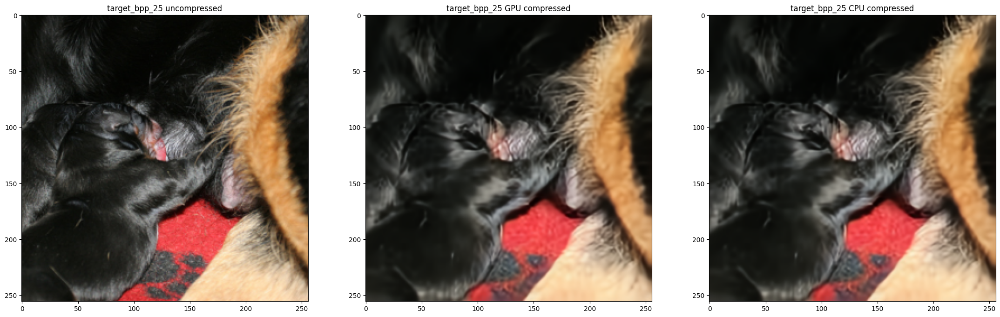

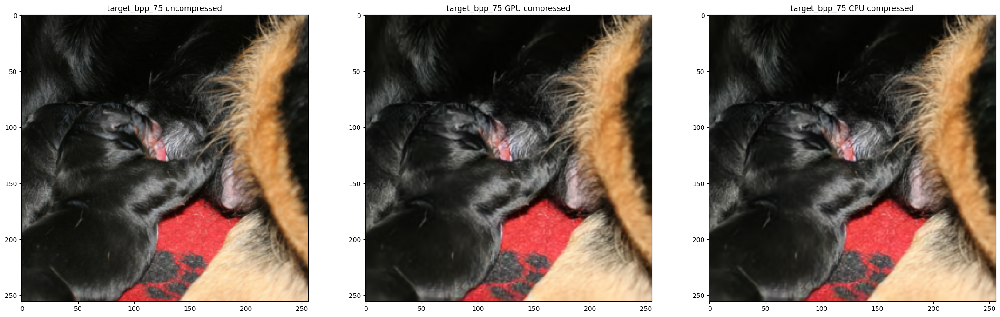

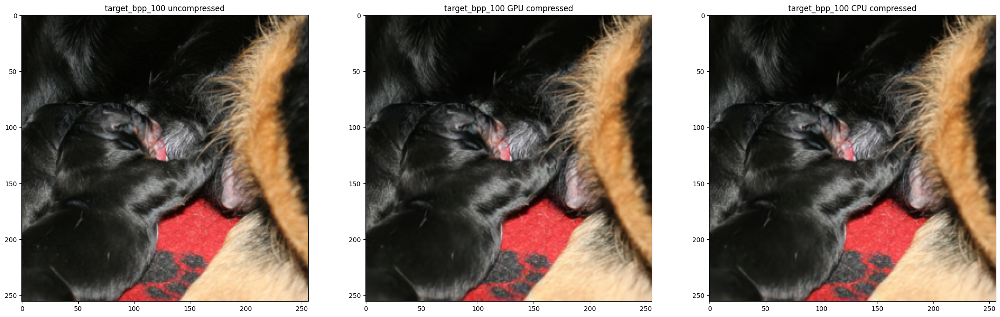

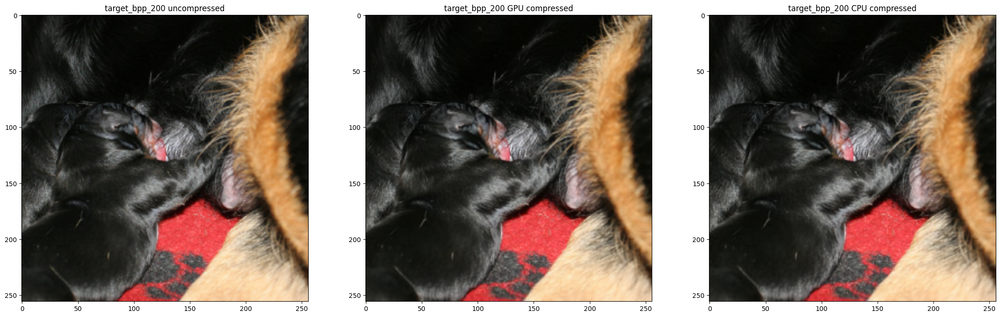

In [24]:
np.random.seed(42)
rnd_idxs = np.random.choice(79, size=1)[0]
filename = all_dfs['filename'].iloc[rnd_idxs]


for target_bpp in all_target_bpps:
    # --- Select the samples
    cpu_sample = Image.open(cpu_df.loc[target_bpp].loc[cpu_df.loc[target_bpp]['filename']==filename]['path'].item())
    gpu_sample = Image.open(gpu_df.loc[target_bpp].loc[gpu_df.loc[target_bpp]['filename']==filename]['path'].item())
    orig_sample = Image.open(os.path.join(or_image_dir, filename))


    # --- Plot them
    fig, axs = plt.subplots(1, 3, figsize=(27, 9))
    axs[0].imshow(orig_sample), axs[0].set_title(f'{target_bpp} uncompressed')
    axs[1].imshow(gpu_sample), axs[1].set_title(f'{target_bpp} GPU compressed')
    axs[2].imshow(cpu_sample), axs[2].set_title(f'{target_bpp} CPU compressed')
    plt.show()

## Let's compute some metrics

In [25]:
# Cycle over the various compressed samples
for idx, r in tqdm(all_dfs.iterrows()):
    # Load the compressed sample
    data_r, _ = DataClass().load_image(r['path'], color_conv='709', device='cuda')
    # Load the uncompressed sample
    data_or, _ = DataClass().load_image(os.path.join(or_image_dir, r['filename']), 
                                        color_conv='709', device='cuda')
    # Compute the metrics
    metrics_vals = metrics.process_images(data_or, data_r)
    metrics_vals = {metric: metrics_vals[idx] for idx, metric in enumerate(metrics.metrics_output)}
    # Add the metrics to the Dataframe
    for metric in metrics.metrics_output:
        all_dfs.loc[idx, metric] = metrics_vals[metric]
    torch.cuda.empty_cache()

0it [00:00, ?it/s]

/nas/home/ecannas/third_party_code/jpeg-ai-reference-software/src/codec/metrics/IW_SSIM_PyTorch.py:324: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.weight = torch.tensor(self.weight).type(self.samplet.type())
/nas/home/ecannas/miniconda3/envs/jpeg_ai_vm/lib/python3.7/site-packages/IPython/core/interactiveshell.py:2976: PerformanceWarning: indexing past lexsort depth may impact performance.
  raw_cell, store_history, silent, shell_futures, cell_id


### Let's plot some

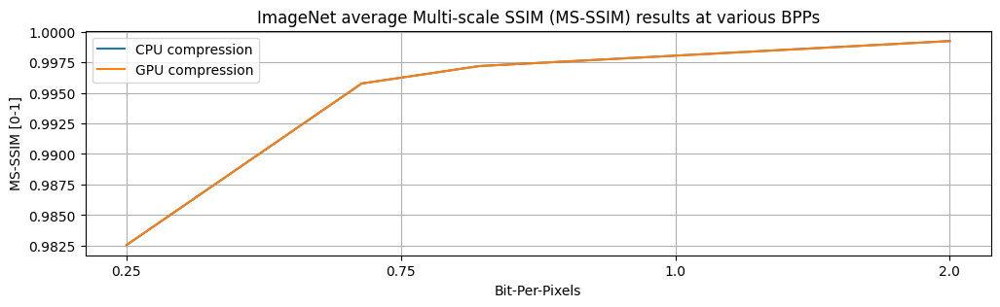

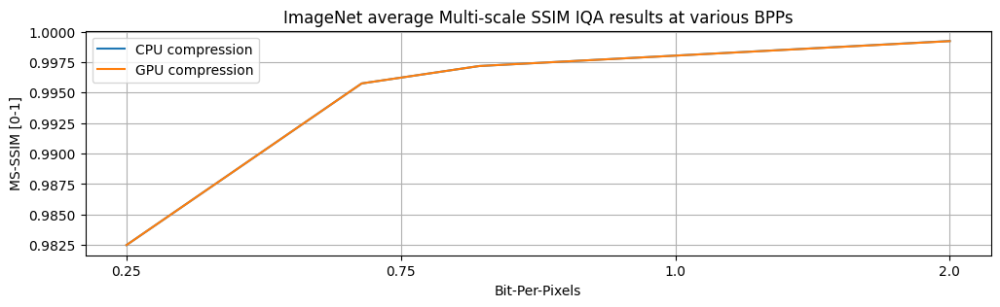

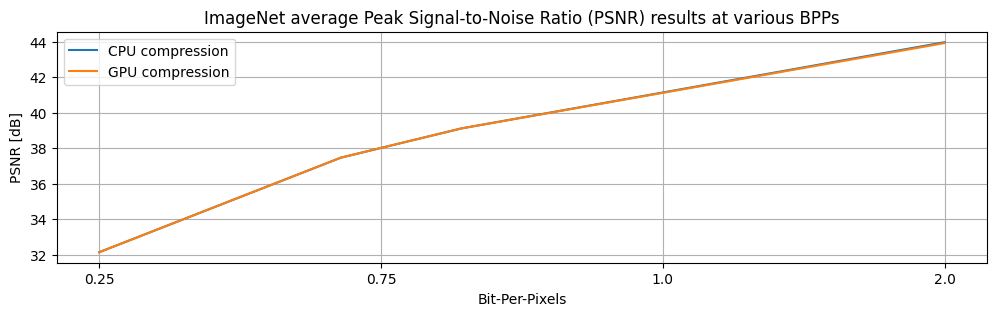

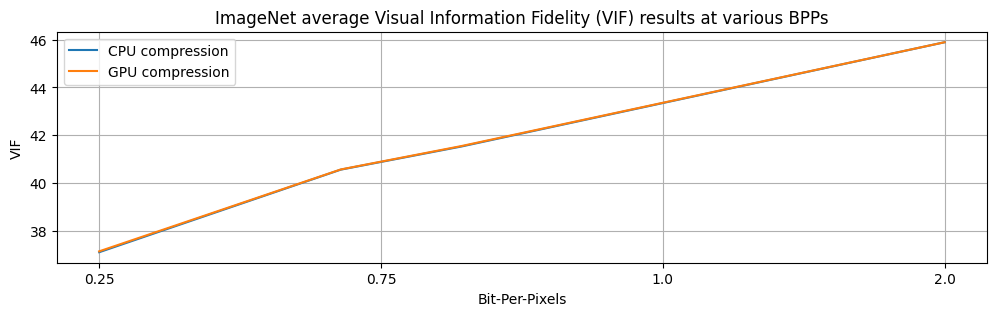

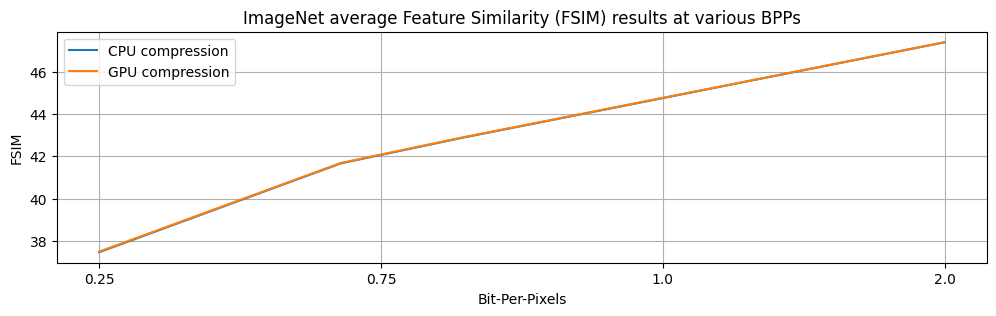

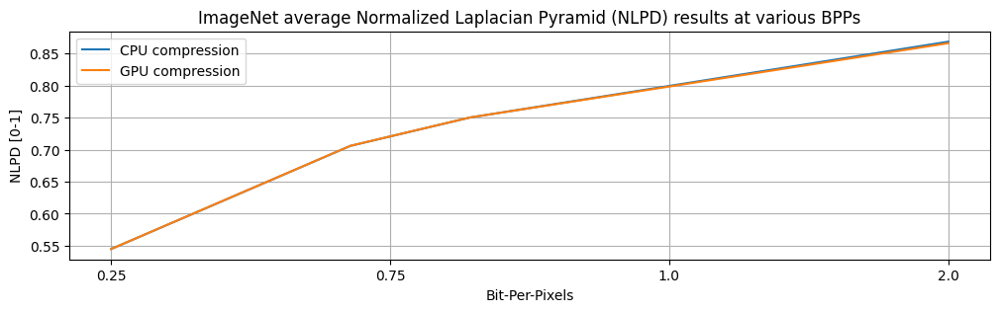

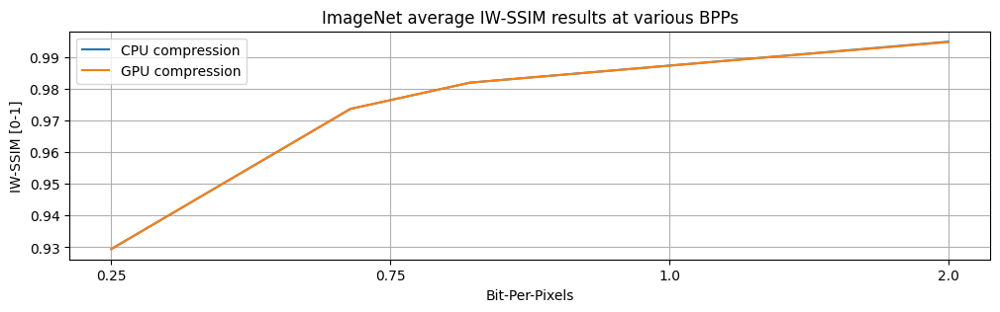

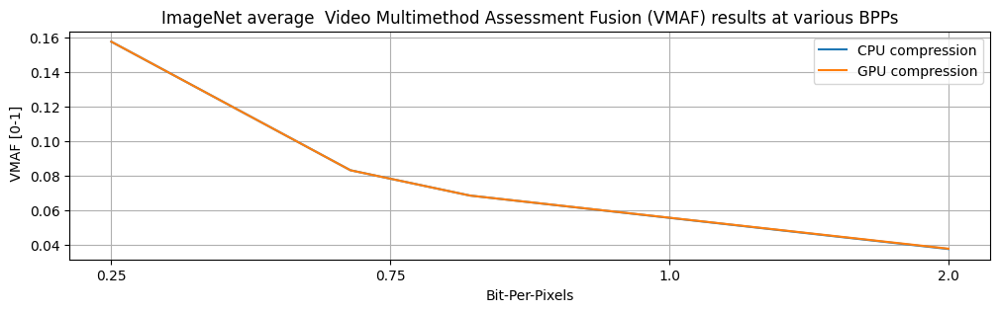

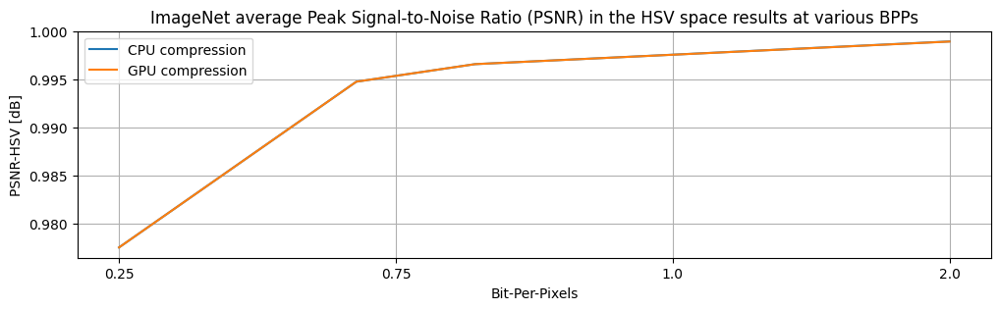

In [38]:
labels_dict = {'msssim_torch': 'Multi-scale SSIM (MS-SSIM)',
  'msssim_iqa': 'Multi-scale SSIM IQA',
  'psnr': 'Peak Signal-to-Noise Ratio (PSNR)',
  'vif': 'Visual Information Fidelity (VIF)',
  'fsim': 'Feature Similarity (FSIM)',
  'nlpd': 'Normalized Laplacian Pyramid (NLPD)',
  'iw-ssim': 'IW-SSIM',
  'vmaf': ' Video Multimethod Assessment Fusion (VMAF)',
  'psnr_hvs': 'Peak Signal-to-Noise Ratio (PSNR) in the HSV space'}

ylabel_dict = {'msssim_torch': 'MS-SSIM [0-1]',
  'msssim_iqa': 'MS-SSIM [0-1]',
  'psnr': 'PSNR [dB]',
  'vif': 'VIF',
  'fsim': 'FSIM',
  'nlpd': 'NLPD [0-1]',
  'iw-ssim': 'IW-SSIM [0-1]',
  'vmaf': ' VMAF [0-1]',
  'psnr_hvs': 'PSNR-HSV [dB]'}

# Let's plot the single metrics
for metric in metrics.metrics_output:
    fig, axs = plt.subplots(1, 1, figsize=(12, 3))
    cpu_metrics = all_dfs.loc['CPU compression'].groupby('Target BPP').mean()[metric]
    cpu_metrics.rename(lambda x: float(x.split('_')[-1])/100, axis=0, inplace=True)
    cpu_metrics.sort_index(inplace=True)
    gpu_metrics = all_dfs.loc['GPU compression'].groupby('Target BPP').mean()[metric]
    gpu_metrics.rename(lambda x: float(x.split('_')[-1])/100, axis=0, inplace=True)
    gpu_metrics.sort_index(inplace=True)
    axs.plot(cpu_metrics, label='CPU compression')
    axs.plot(gpu_metrics, label='GPU compression')
    plt.legend()
    plt.grid()
    plt.title(f'ImageNet average {labels_dict[metric]} results at various BPPs')
    plt.ylabel(ylabel_dict[metric])
    plt.xticks(ticks=np.linspace(gpu_metrics.index[0], gpu_metrics.index[-1], len(gpu_metrics.index)),
               labels=gpu_metrics.index.tolist())
    plt.xlabel('Bit-Per-Pixels')
    plt.show()

### Let's compare the GPU and CPU compressed samples directly

In [82]:
# Cycle over the various compressed samples
compare_device_df = all_dfs.loc['GPU compression'].copy()

for idx, r in tqdm(all_dfs.loc['GPU compression'].iterrows()):
    # Load the compressed sample
    data_r, _ = DataClass().load_image(r['path'], color_conv='709', device='cuda')
    # Load the uncompressed sample
    data_or, _ = DataClass().load_image(cpu_df.loc[idx[0]].loc[cpu_df.loc[idx[0], 'filename']==r['filename']]['path'].item(),
                                        color_conv='709', device='cuda')
    # Compute the metrics
    metrics_vals = metrics.process_images(data_or, data_r)
    metrics_vals = {metric: metrics_vals[idx] for idx, metric in enumerate(metrics.metrics_output)}
    # Add the metrics to the Dataframe
    for metric in metrics.metrics_output:
        compare_device_df.loc[idx, metric] = metrics_vals[metric]
    torch.cuda.empty_cache()

0it [00:00, ?it/s]

/nas/home/ecannas/third_party_code/jpeg-ai-reference-software/src/codec/metrics/IW_SSIM_PyTorch.py:324: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.weight = torch.tensor(self.weight).type(self.samplet.type())


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


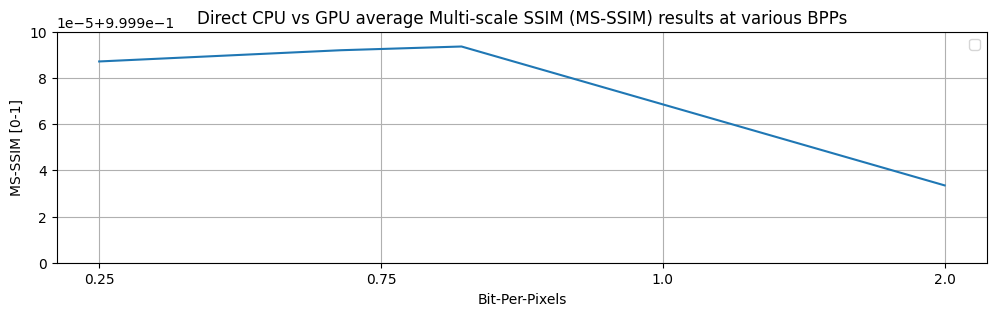

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


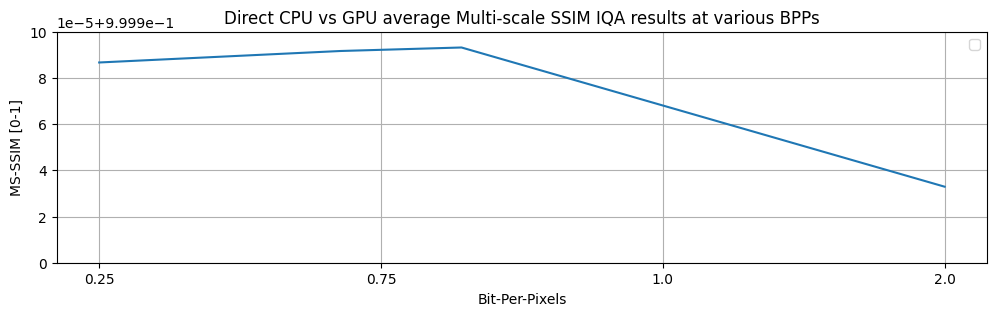

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


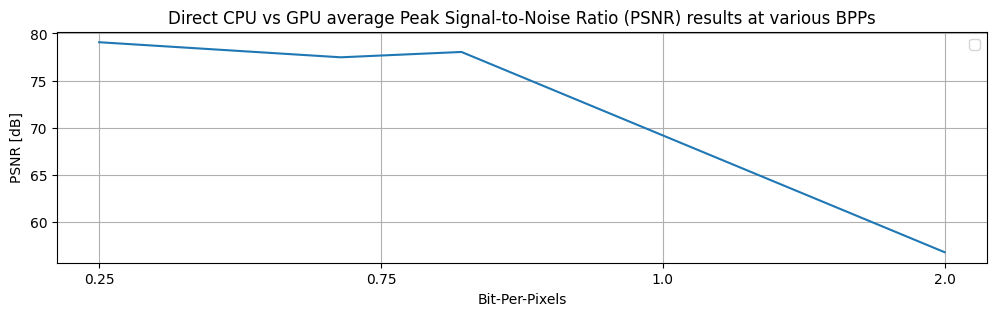

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


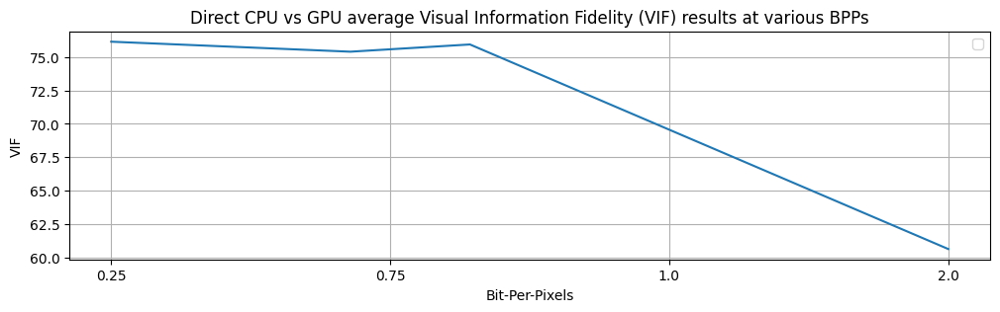

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


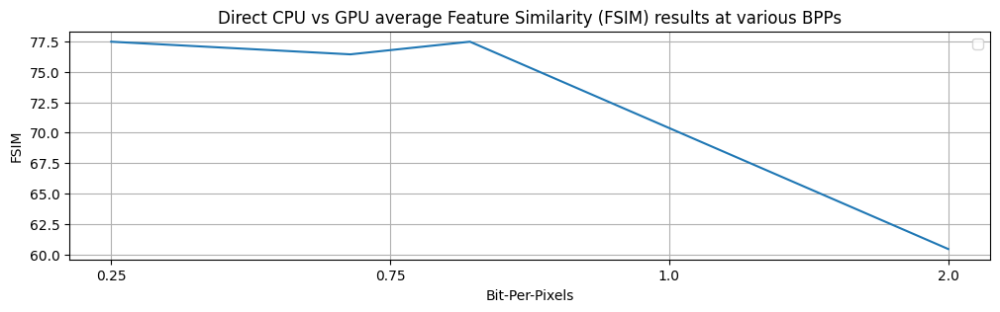

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


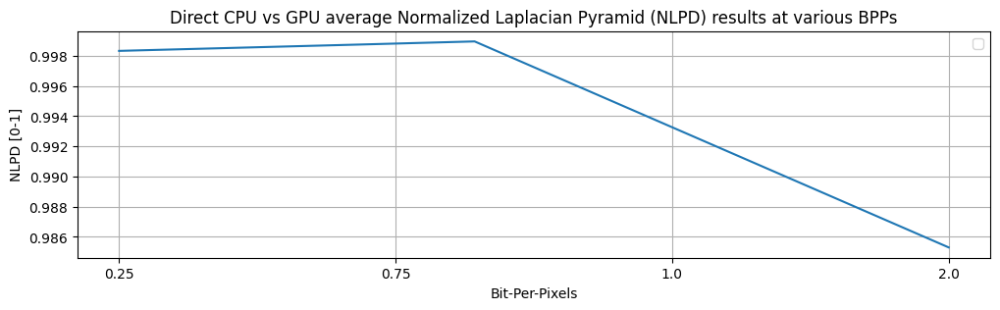

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


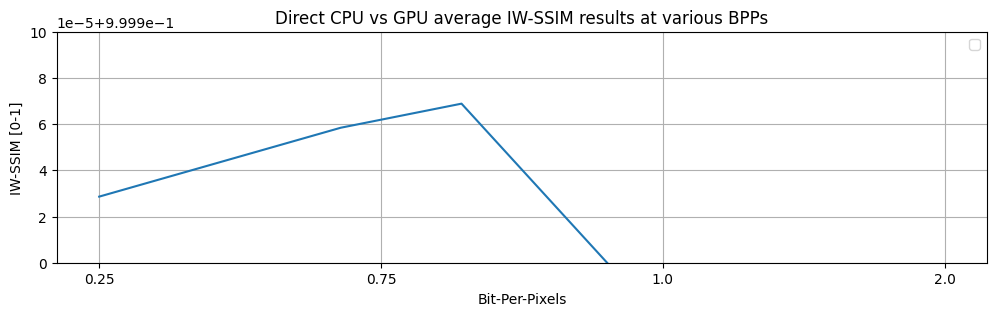

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


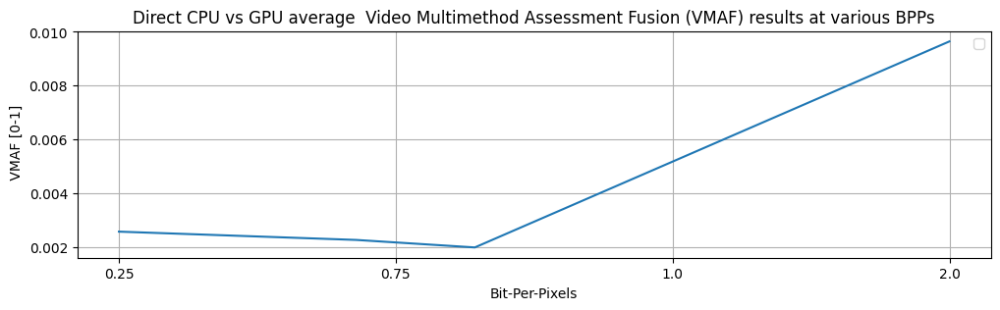

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


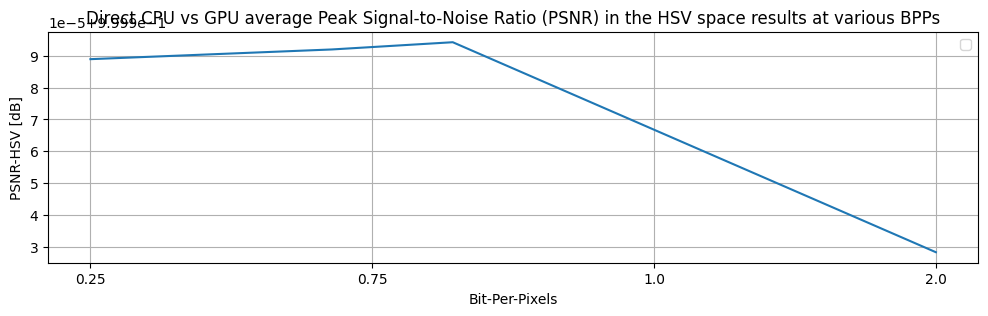

In [89]:
labels_dict = {'msssim_torch': 'Multi-scale SSIM (MS-SSIM)',
  'msssim_iqa': 'Multi-scale SSIM IQA',
  'psnr': 'Peak Signal-to-Noise Ratio (PSNR)',
  'vif': 'Visual Information Fidelity (VIF)',
  'fsim': 'Feature Similarity (FSIM)',
  'nlpd': 'Normalized Laplacian Pyramid (NLPD)',
  'iw-ssim': 'IW-SSIM',
  'vmaf': ' Video Multimethod Assessment Fusion (VMAF)',
  'psnr_hvs': 'Peak Signal-to-Noise Ratio (PSNR) in the HSV space'}

ylabel_dict = {'msssim_torch': 'MS-SSIM [0-1]',
  'msssim_iqa': 'MS-SSIM [0-1]',
  'psnr': 'PSNR [dB]',
  'vif': 'VIF',
  'fsim': 'FSIM',
  'nlpd': 'NLPD [0-1]',
  'iw-ssim': 'IW-SSIM [0-1]',
  'vmaf': ' VMAF [0-1]',
  'psnr_hvs': 'PSNR-HSV [dB]'}

# Let's plot the single metrics
for metric in metrics.metrics_output:
    fig, axs = plt.subplots(1, 1, figsize=(12, 3))
    cpu_metrics = compare_device_df.groupby('Target BPP').mean()[metric]
    cpu_metrics.rename(lambda x: float(x.split('_')[-1])/100, axis=0, inplace=True)
    cpu_metrics.sort_index(inplace=True)
    axs.plot(cpu_metrics)
    plt.legend()
    plt.grid()
    plt.title(f'Direct CPU vs GPU average {labels_dict[metric]} results at various BPPs')
    plt.ylabel(ylabel_dict[metric])
    if 'ssim' in metric:
        plt.ylim([0.9999, 1.0])
    plt.xticks(ticks=np.linspace(gpu_metrics.index[0], gpu_metrics.index[-1], len(gpu_metrics.index)),
               labels=gpu_metrics.index.tolist())
    plt.xlabel('Bit-Per-Pixels')
    plt.show()

### CelebA

In [2]:
rec_image_dir = '/nas/public/exchange/JPEG-AI/data/TEST/CPU_vs_GPU/celeba'
or_image_dir = '/nas/public/exchange/JPEG-AI/data/TEST/celeba/original'

In [4]:
# --- Create a dataframe for all info
all_dfs = []
all_target_bpps = os.listdir(os.path.join(rec_image_dir, 'compressed_CPU'))[1:]

# --- Find GPU-compressed samples
gpu_df = []
for target_bpp in all_target_bpps:
    all_bpp_images = glob.glob(os.path.join(rec_image_dir, 'compressed_GPU', target_bpp, '*.png'))
    print(f'We have {len(all_bpp_images)} for {target_bpp}')
    df = pd.DataFrame(all_bpp_images, columns=['path'])
    df = pd.concat({target_bpp: df}, names=['Target BPP'])
    df['filename'] = df['path'].apply(lambda x: os.path.basename(x))
    gpu_df.append(df)
gpu_df = pd.concat(gpu_df)
all_dfs.append(pd.concat({'GPU compression': gpu_df}, names=['Device']))

# --- Find CPU-compressed samples
cpu_df = []
for target_bpp in all_target_bpps:
    all_bpp_images = glob.glob(os.path.join(rec_image_dir, 'compressed_CPU', target_bpp, '*.png'))
    print(f'We have {len(all_bpp_images)} for {target_bpp}')
    df = pd.DataFrame(all_bpp_images, columns=['path'])
    df = pd.concat({target_bpp: df}, names=['Target BPP'])
    df['filename'] = df['path'].apply(lambda x: os.path.basename(x))
    # Keep only those entries which are present also in the GPU case
    df = df[df['filename'].isin(gpu_df.loc[target_bpp, 'filename'])]
    cpu_df.append(df)
cpu_df = pd.concat(cpu_df)
all_dfs.append(pd.concat({'CPU compression': cpu_df}, names=['Device']))

# --- Concat everything
all_dfs = pd.concat(all_dfs)
all_dfs

We have 100 for target_bpp_25
We have 100 for target_bpp_75
We have 78 for target_bpp_100
We have 100 for target_bpp_200
We have 100 for target_bpp_25
We have 100 for target_bpp_75
We have 79 for target_bpp_100
We have 100 for target_bpp_200


path  \
Device          Target BPP                                                             
GPU compression target_bpp_25  0   /nas/public/exchange/JPEG-AI/data/TEST/CPU_vs_...   
                               1   /nas/public/exchange/JPEG-AI/data/TEST/CPU_vs_...   
                               2   /nas/public/exchange/JPEG-AI/data/TEST/CPU_vs_...   
                               3   /nas/public/exchange/JPEG-AI/data/TEST/CPU_vs_...   
                               4   /nas/public/exchange/JPEG-AI/data/TEST/CPU_vs_...   
...                                                                              ...   
CPU compression target_bpp_200 95  /nas/public/exchange/JPEG-AI/data/TEST/CPU_vs_...   
                               96  /nas/public/exchange/JPEG-AI/data/TEST/CPU_vs_...   
                               97  /nas/public/exchange/JPEG-AI/data/TEST/CPU_vs_...   
                               98  /nas/public/exchange/JPEG-AI/data/TEST/CPU_vs_...   
                               99  /nas/public/exchange/JPEG-AI/data/TEST/CPU_vs_...   

                                   filename  
Device          Target BPP                   
GPU compression target_bpp_25  0   0943.png  
                               1   0749.png  
                               2   0429.png  
                               3   0340.png  
                               4   1981.png  
...                                     ...  
CPU compression target_bpp_200 95  1132.png  
                               96  0116.png  
                               97  1109.png  
                               98  1581.png  
                               99  0110.png  

[756 rows x 2 columns]

### Let's look at some samples

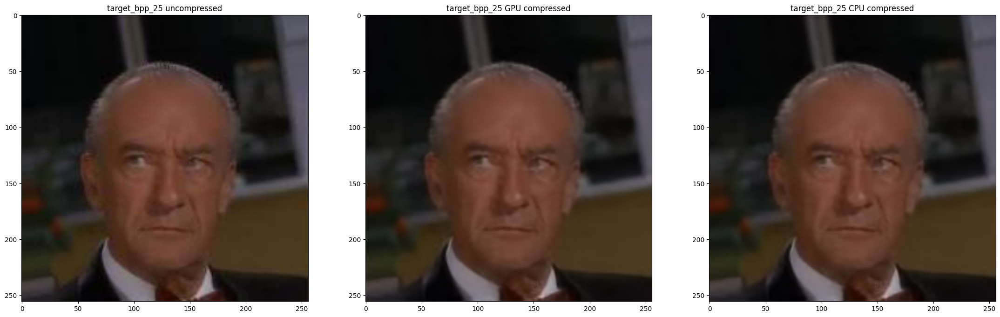

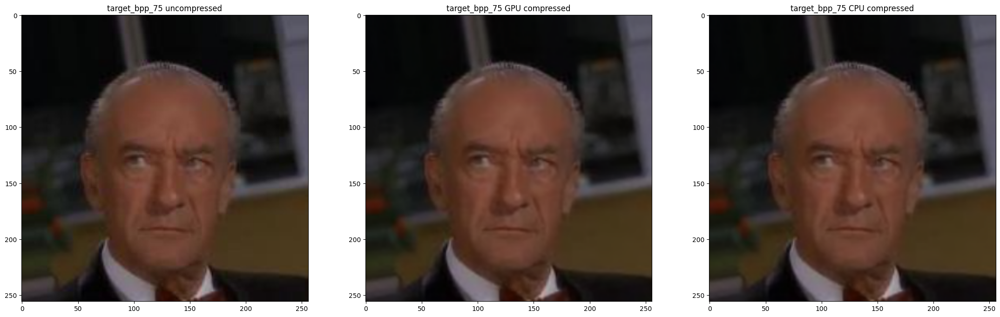

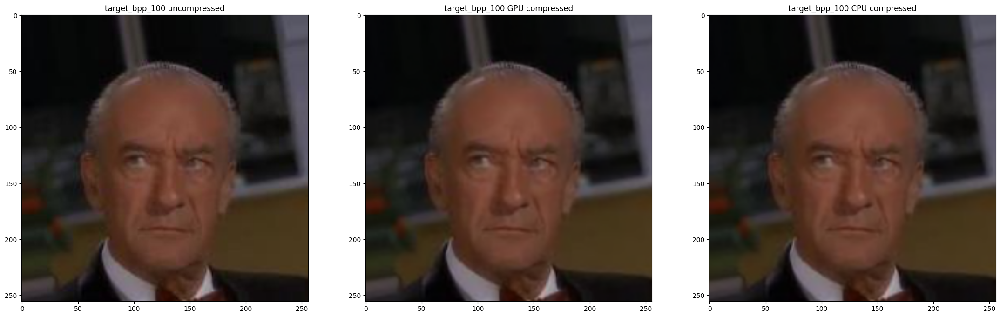

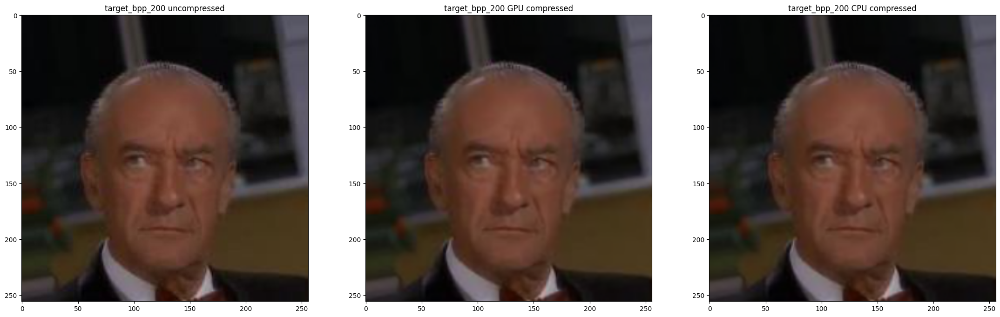

In [13]:
np.random.seed(42)
rnd_idxs = np.random.choice(50, size=1)[0]
filename = all_dfs['filename'].iloc[rnd_idxs]


for target_bpp in all_target_bpps:
    # --- Select the samples
    cpu_sample = Image.open(cpu_df.loc[target_bpp].loc[cpu_df.loc[target_bpp]['filename']==filename]['path'].item())
    gpu_sample = Image.open(gpu_df.loc[target_bpp].loc[gpu_df.loc[target_bpp]['filename']==filename]['path'].item())
    orig_sample = Image.open(os.path.join(or_image_dir, filename))


    # --- Plot them
    fig, axs = plt.subplots(1, 3, figsize=(27, 9))
    axs[0].imshow(orig_sample), axs[0].set_title(f'{target_bpp} uncompressed')
    axs[1].imshow(gpu_sample), axs[1].set_title(f'{target_bpp} GPU compressed')
    axs[2].imshow(cpu_sample), axs[2].set_title(f'{target_bpp} CPU compressed')
    plt.show()

### Let's compute some metrics

In [16]:
# Cycle over the various compressed samples
for idx, r in tqdm(all_dfs.iterrows()):
    # Load the compressed sample
    data_r, _ = DataClass().load_image(r['path'], color_conv='709', device='cuda')
    # Load the uncompressed sample
    data_or, _ = DataClass().load_image(os.path.join(or_image_dir, r['filename']), 
                                        color_conv='709', device='cuda')
    # Compute the metrics
    metrics_vals = metrics.process_images(data_or, data_r)
    metrics_vals = {metric: metrics_vals[idx] for idx, metric in enumerate(metrics.metrics_output)}
    # Add the metrics to the Dataframe
    for metric in metrics.metrics_output:
        all_dfs.loc[idx, metric] = metrics_vals[metric]
    torch.cuda.empty_cache()

0it [00:00, ?it/s]

RuntimeError: module compiled against API version 0xe but this version of numpy is 0xd

/nas/home/ecannas/miniconda3/envs/jpeg_ai_vm/lib/python3.7/site-packages/IPython/core/interactiveshell.py:2976: PerformanceWarning: indexing past lexsort depth may impact performance.
  raw_cell, store_history, silent, shell_futures, cell_id
/nas/home/ecannas/third_party_code/jpeg-ai-reference-software/src/codec/metrics/IW_SSIM_PyTorch.py:324: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.weight = torch.tensor(self.weight).type(self.samplet.type())


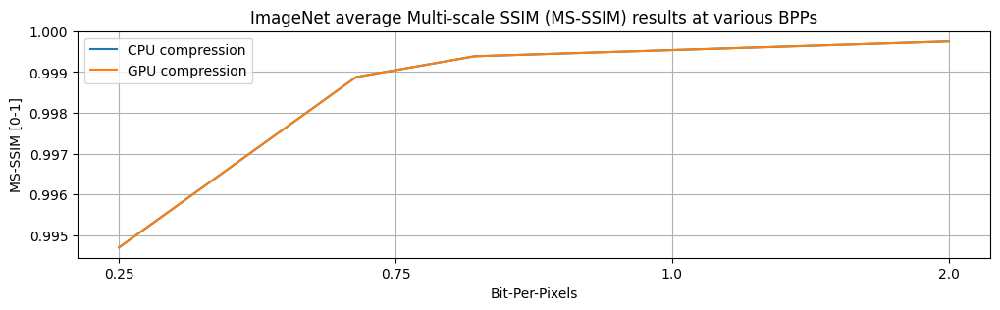

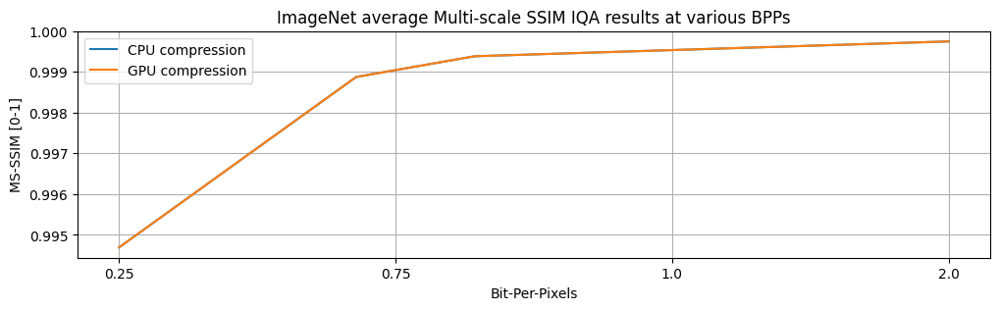

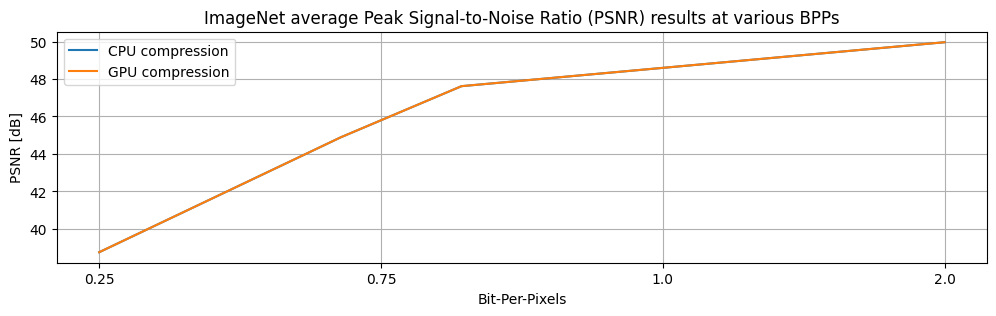

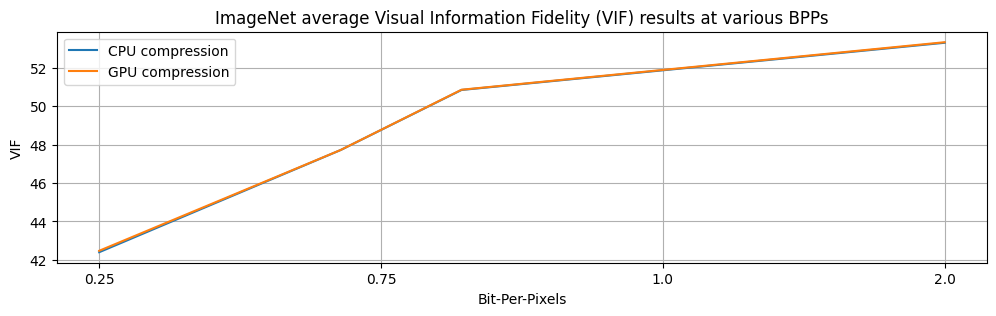

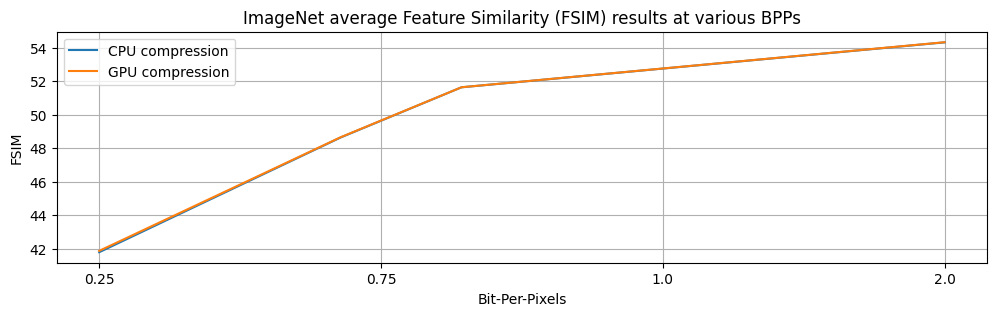

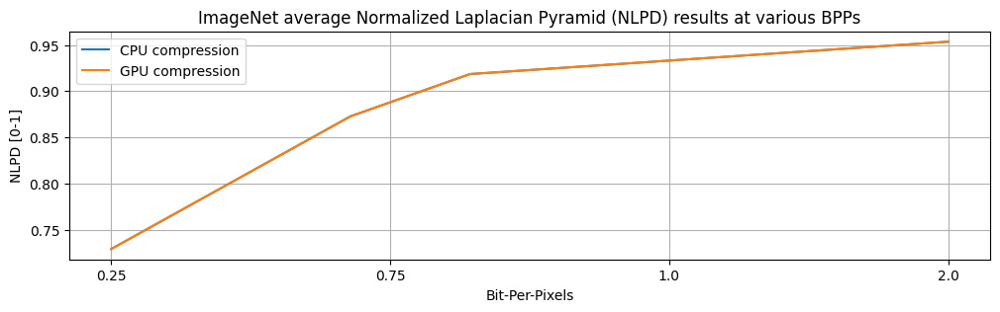

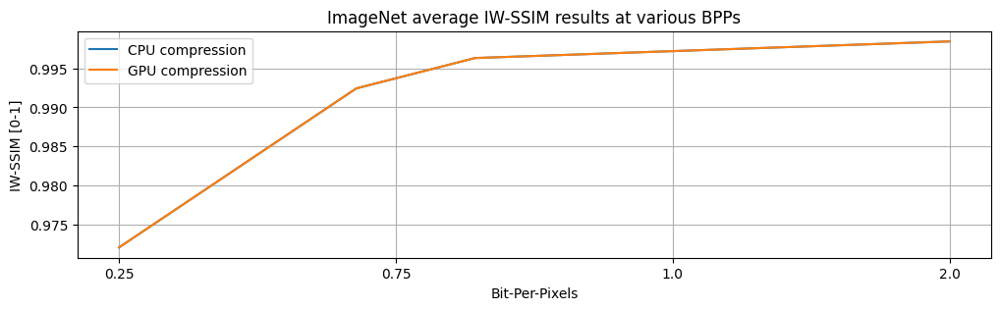

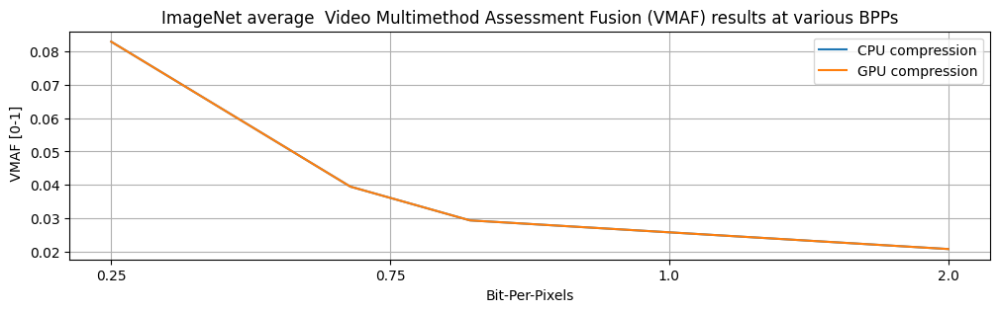

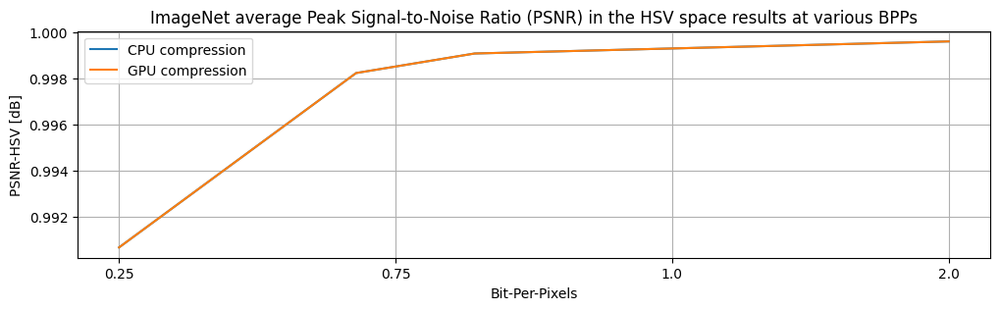

In [17]:
labels_dict = {'msssim_torch': 'Multi-scale SSIM (MS-SSIM)',
  'msssim_iqa': 'Multi-scale SSIM IQA',
  'psnr': 'Peak Signal-to-Noise Ratio (PSNR)',
  'vif': 'Visual Information Fidelity (VIF)',
  'fsim': 'Feature Similarity (FSIM)',
  'nlpd': 'Normalized Laplacian Pyramid (NLPD)',
  'iw-ssim': 'IW-SSIM',
  'vmaf': ' Video Multimethod Assessment Fusion (VMAF)',
  'psnr_hvs': 'Peak Signal-to-Noise Ratio (PSNR) in the HSV space'}

ylabel_dict = {'msssim_torch': 'MS-SSIM [0-1]',
  'msssim_iqa': 'MS-SSIM [0-1]',
  'psnr': 'PSNR [dB]',
  'vif': 'VIF',
  'fsim': 'FSIM',
  'nlpd': 'NLPD [0-1]',
  'iw-ssim': 'IW-SSIM [0-1]',
  'vmaf': ' VMAF [0-1]',
  'psnr_hvs': 'PSNR-HSV [dB]'}

# Let's plot the single metrics
for metric in metrics.metrics_output:
    fig, axs = plt.subplots(1, 1, figsize=(12, 3))
    cpu_metrics = all_dfs.loc['CPU compression'].groupby('Target BPP').mean()[metric]
    cpu_metrics.rename(lambda x: float(x.split('_')[-1])/100, axis=0, inplace=True)
    cpu_metrics.sort_index(inplace=True)
    gpu_metrics = all_dfs.loc['GPU compression'].groupby('Target BPP').mean()[metric]
    gpu_metrics.rename(lambda x: float(x.split('_')[-1])/100, axis=0, inplace=True)
    gpu_metrics.sort_index(inplace=True)
    axs.plot(cpu_metrics, label='CPU compression')
    axs.plot(gpu_metrics, label='GPU compression')
    plt.legend()
    plt.grid()
    plt.title(f'ImageNet average {labels_dict[metric]} results at various BPPs')
    plt.ylabel(ylabel_dict[metric])
    plt.xticks(ticks=np.linspace(gpu_metrics.index[0], gpu_metrics.index[-1], len(gpu_metrics.index)),
               labels=gpu_metrics.index.tolist())
    plt.xlabel('Bit-Per-Pixels')
    plt.show()

### Let's compare GPU and CPU compression between each other

In [18]:
# Cycle over the various compressed samples
compare_device_df = all_dfs.loc['GPU compression'].copy()

for idx, r in tqdm(all_dfs.loc['GPU compression'].iterrows()):
    # Load the compressed sample
    data_r, _ = DataClass().load_image(r['path'], color_conv='709', device='cuda')
    # Load the uncompressed sample
    data_or, _ = DataClass().load_image(cpu_df.loc[idx[0]].loc[cpu_df.loc[idx[0], 'filename']==r['filename']]['path'].item(),
                                        color_conv='709', device='cuda')
    # Compute the metrics
    metrics_vals = metrics.process_images(data_or, data_r)
    metrics_vals = {metric: metrics_vals[idx] for idx, metric in enumerate(metrics.metrics_output)}
    # Add the metrics to the Dataframe
    for metric in metrics.metrics_output:
        compare_device_df.loc[idx, metric] = metrics_vals[metric]
    torch.cuda.empty_cache()

0it [00:00, ?it/s]

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


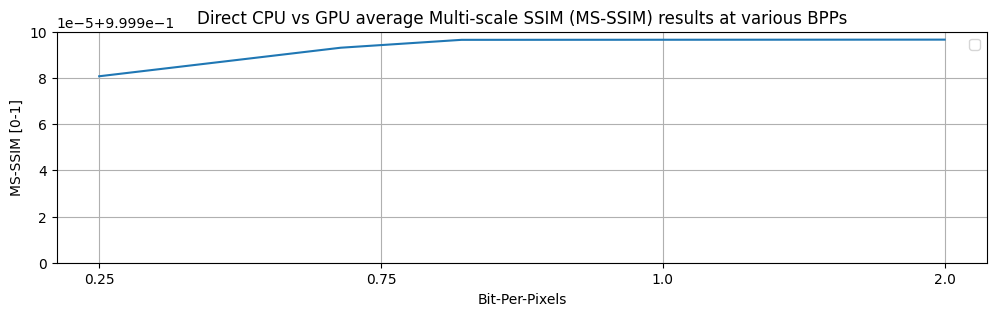

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


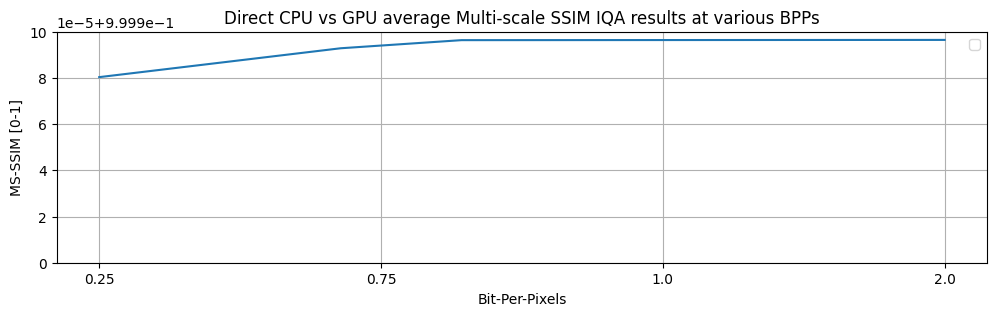

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


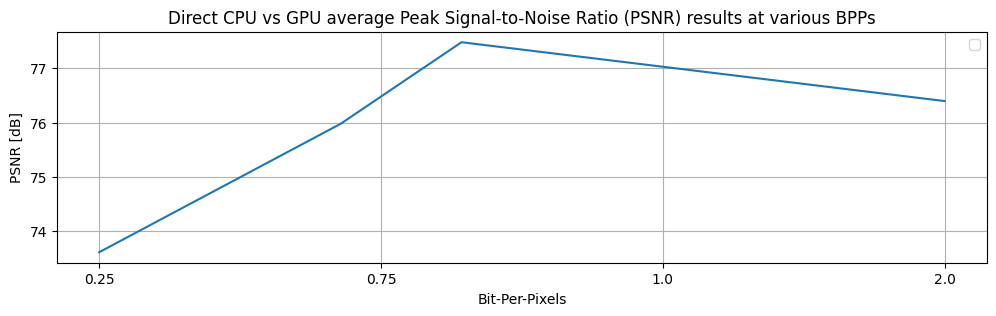

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


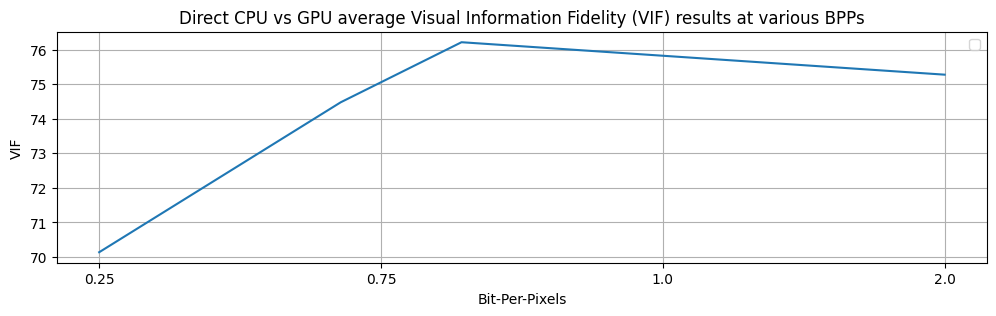

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


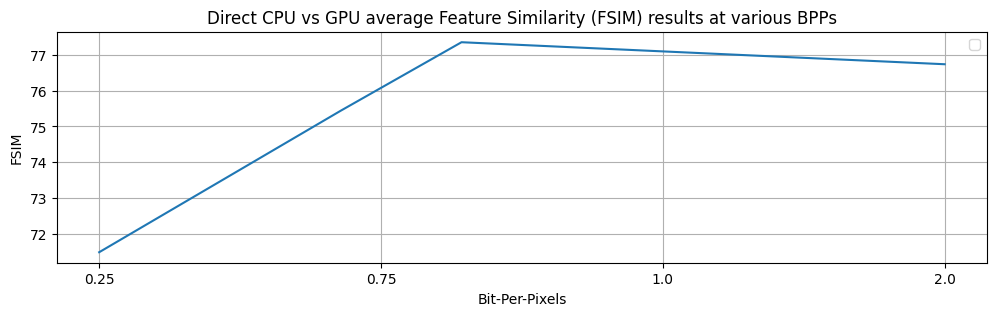

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


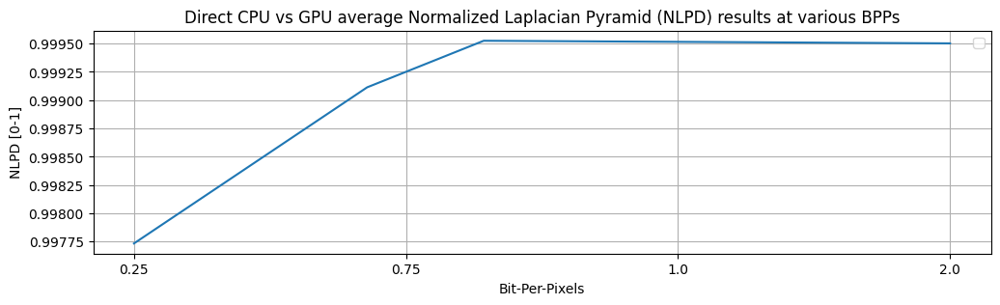

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


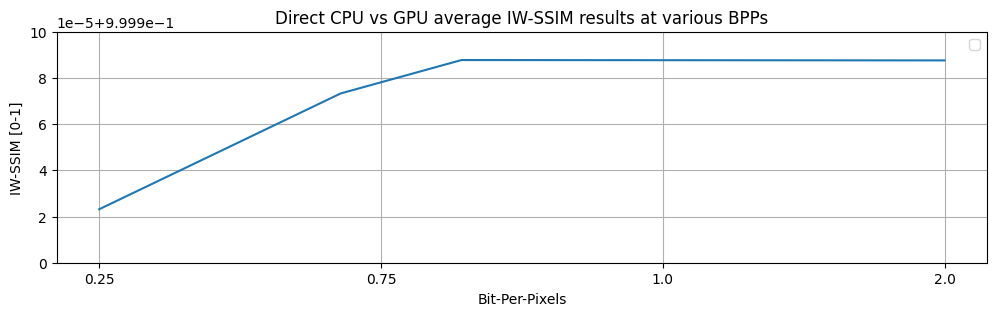

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


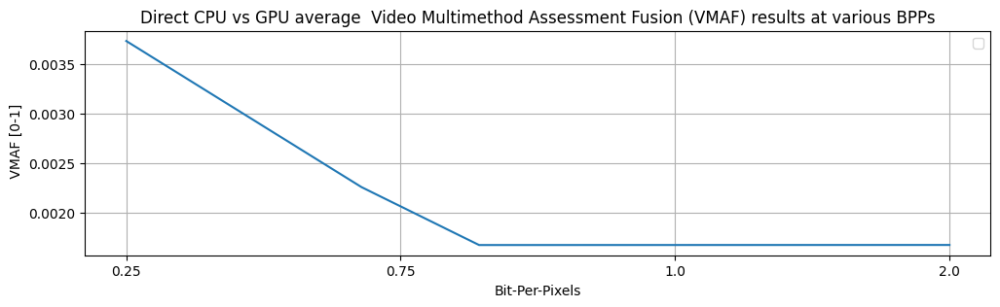

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


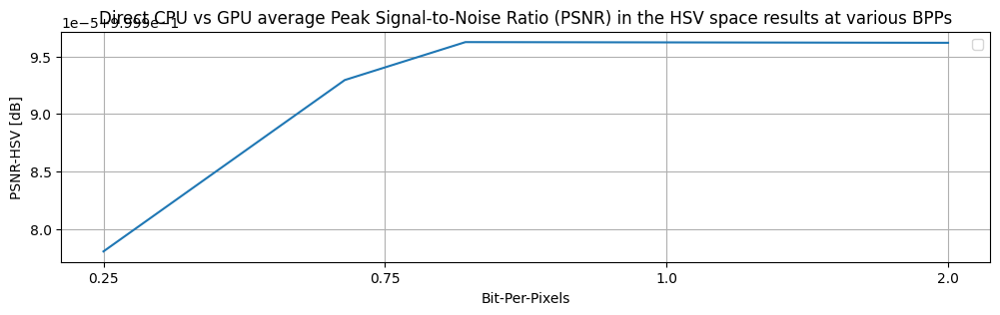

In [19]:
labels_dict = {'msssim_torch': 'Multi-scale SSIM (MS-SSIM)',
  'msssim_iqa': 'Multi-scale SSIM IQA',
  'psnr': 'Peak Signal-to-Noise Ratio (PSNR)',
  'vif': 'Visual Information Fidelity (VIF)',
  'fsim': 'Feature Similarity (FSIM)',
  'nlpd': 'Normalized Laplacian Pyramid (NLPD)',
  'iw-ssim': 'IW-SSIM',
  'vmaf': ' Video Multimethod Assessment Fusion (VMAF)',
  'psnr_hvs': 'Peak Signal-to-Noise Ratio (PSNR) in the HSV space'}

ylabel_dict = {'msssim_torch': 'MS-SSIM [0-1]',
  'msssim_iqa': 'MS-SSIM [0-1]',
  'psnr': 'PSNR [dB]',
  'vif': 'VIF',
  'fsim': 'FSIM',
  'nlpd': 'NLPD [0-1]',
  'iw-ssim': 'IW-SSIM [0-1]',
  'vmaf': ' VMAF [0-1]',
  'psnr_hvs': 'PSNR-HSV [dB]'}

# Let's plot the single metrics
for metric in metrics.metrics_output:
    fig, axs = plt.subplots(1, 1, figsize=(12, 3))
    cpu_metrics = compare_device_df.groupby('Target BPP').mean()[metric]
    cpu_metrics.rename(lambda x: float(x.split('_')[-1])/100, axis=0, inplace=True)
    cpu_metrics.sort_index(inplace=True)
    axs.plot(cpu_metrics)
    plt.legend()
    plt.grid()
    plt.title(f'Direct CPU vs GPU average {labels_dict[metric]} results at various BPPs')
    plt.ylabel(ylabel_dict[metric])
    if 'ssim' in metric:
        plt.ylim([0.9999, 1.0])
    plt.xticks(ticks=np.linspace(gpu_metrics.index[0], gpu_metrics.index[-1], len(gpu_metrics.index)),
               labels=gpu_metrics.index.tolist())
    plt.xlabel('Bit-Per-Pixels')
    plt.show()

### COCO

In [20]:
rec_image_dir = '/nas/public/exchange/JPEG-AI/data/TEST/CPU_vs_GPU/coco'
or_image_dir = '/nas/public/exchange/JPEG-AI/data/TEST/coco/original'

In [21]:
# --- Create a dataframe for all info
all_dfs = []
all_target_bpps = os.listdir(os.path.join(rec_image_dir, 'compressed_CPU'))[1:]

# --- Find GPU-compressed samples
gpu_df = []
for target_bpp in all_target_bpps:
    all_bpp_images = glob.glob(os.path.join(rec_image_dir, 'compressed_GPU', target_bpp, '*.png'))
    print(f'We have {len(all_bpp_images)} for {target_bpp}')
    df = pd.DataFrame(all_bpp_images, columns=['path'])
    df = pd.concat({target_bpp: df}, names=['Target BPP'])
    df['filename'] = df['path'].apply(lambda x: os.path.basename(x))
    gpu_df.append(df)
gpu_df = pd.concat(gpu_df)
all_dfs.append(pd.concat({'GPU compression': gpu_df}, names=['Device']))

# --- Find CPU-compressed samples
cpu_df = []
for target_bpp in all_target_bpps:
    all_bpp_images = glob.glob(os.path.join(rec_image_dir, 'compressed_CPU', target_bpp, '*.png'))
    print(f'We have {len(all_bpp_images)} for {target_bpp}')
    df = pd.DataFrame(all_bpp_images, columns=['path'])
    df = pd.concat({target_bpp: df}, names=['Target BPP'])
    df['filename'] = df['path'].apply(lambda x: os.path.basename(x))
    # Keep only those entries which are present also in the GPU case
    df = df[df['filename'].isin(gpu_df.loc[target_bpp, 'filename'])]
    cpu_df.append(df)
cpu_df = pd.concat(cpu_df)
all_dfs.append(pd.concat({'CPU compression': cpu_df}, names=['Device']))

# --- Concat everything
all_dfs = pd.concat(all_dfs)
all_dfs

We have 86 for target_bpp_25
We have 100 for target_bpp_75
We have 15 for target_bpp_100
We have 100 for target_bpp_200
We have 86 for target_bpp_25
We have 100 for target_bpp_75
We have 15 for target_bpp_100
We have 100 for target_bpp_200


path  \
Device          Target BPP                                                             
GPU compression target_bpp_25  0   /nas/public/exchange/JPEG-AI/data/TEST/CPU_vs_...   
                               1   /nas/public/exchange/JPEG-AI/data/TEST/CPU_vs_...   
                               2   /nas/public/exchange/JPEG-AI/data/TEST/CPU_vs_...   
                               3   /nas/public/exchange/JPEG-AI/data/TEST/CPU_vs_...   
                               4   /nas/public/exchange/JPEG-AI/data/TEST/CPU_vs_...   
...                                                                              ...   
CPU compression target_bpp_200 95  /nas/public/exchange/JPEG-AI/data/TEST/CPU_vs_...   
                               96  /nas/public/exchange/JPEG-AI/data/TEST/CPU_vs_...   
                               97  /nas/public/exchange/JPEG-AI/data/TEST/CPU_vs_...   
                               98  /nas/public/exchange/JPEG-AI/data/TEST/CPU_vs_...   
                               99  /nas/public/exchange/JPEG-AI/data/TEST/CPU_vs_...   

                                           filename  
Device          Target BPP                           
GPU compression target_bpp_25  0   000000227478.png  
                               1   000000057150.png  
                               2   000000554156.png  
                               3   000000116068.png  
                               4   000000494863.png  
...                                             ...  
CPU compression target_bpp_200 95  000000557884.png  
                               96  000000324715.png  
                               97  000000421757.png  
                               98  000000060835.png  
                               99  000000492362.png  

[602 rows x 2 columns]

### Let's look at some samples

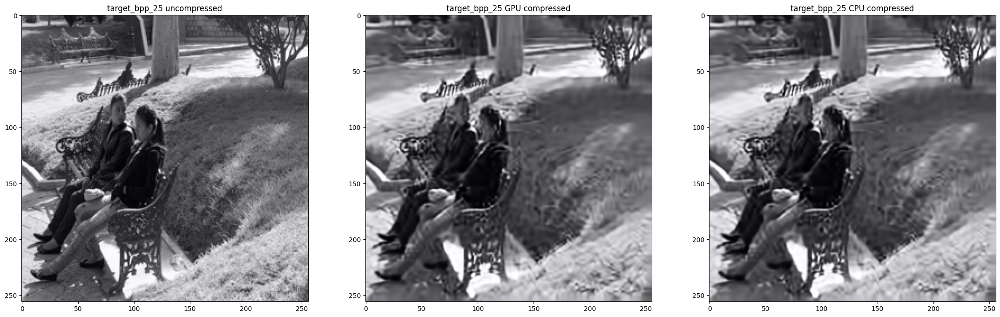

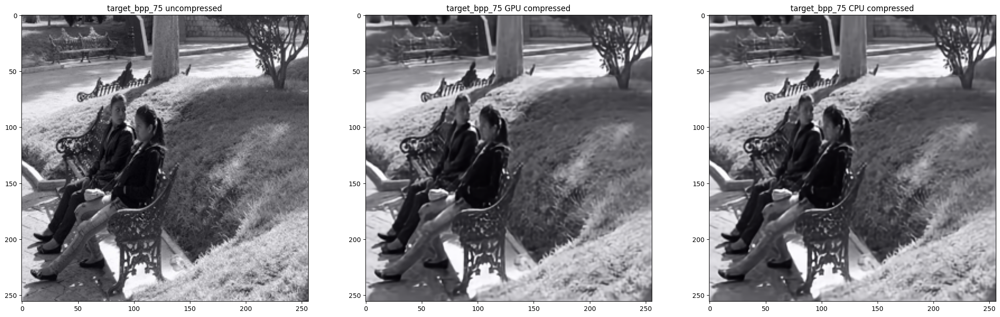

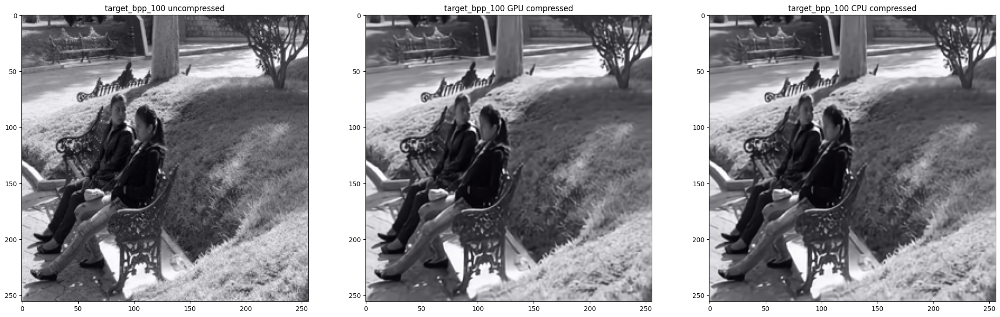

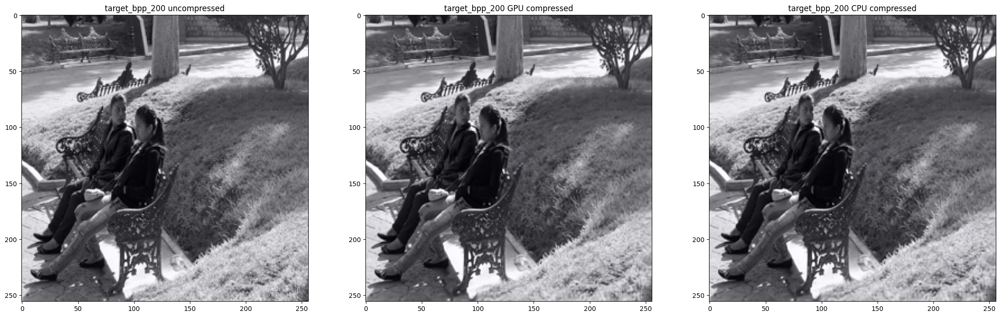

In [25]:
np.random.seed(42)
rnd_idxs = np.random.choice(1, size=1)[0]
filename = all_dfs['filename'].iloc[rnd_idxs]


for target_bpp in all_target_bpps:
    # --- Select the samples
    cpu_sample = Image.open(cpu_df.loc[target_bpp].loc[cpu_df.loc[target_bpp]['filename']==filename]['path'].item())
    gpu_sample = Image.open(gpu_df.loc[target_bpp].loc[gpu_df.loc[target_bpp]['filename']==filename]['path'].item())
    orig_sample = Image.open(os.path.join(or_image_dir, filename))


    # --- Plot them
    fig, axs = plt.subplots(1, 3, figsize=(27, 9))
    axs[0].imshow(orig_sample), axs[0].set_title(f'{target_bpp} uncompressed')
    axs[1].imshow(gpu_sample), axs[1].set_title(f'{target_bpp} GPU compressed')
    axs[2].imshow(cpu_sample), axs[2].set_title(f'{target_bpp} CPU compressed')
    plt.show()

### Let's compute some metrics

In [26]:
# Cycle over the various compressed samples
for idx, r in tqdm(all_dfs.iterrows()):
    # Load the compressed sample
    data_r, _ = DataClass().load_image(r['path'], color_conv='709', device='cuda')
    # Load the uncompressed sample
    data_or, _ = DataClass().load_image(os.path.join(or_image_dir, r['filename']), 
                                        color_conv='709', device='cuda')
    # Compute the metrics
    metrics_vals = metrics.process_images(data_or, data_r)
    metrics_vals = {metric: metrics_vals[idx] for idx, metric in enumerate(metrics.metrics_output)}
    # Add the metrics to the Dataframe
    for metric in metrics.metrics_output:
        all_dfs.loc[idx, metric] = metrics_vals[metric]
    torch.cuda.empty_cache()

0it [00:00, ?it/s]

/nas/home/ecannas/third_party_code/jpeg-ai-reference-software/src/codec/metrics/IW_SSIM_PyTorch.py:324: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.weight = torch.tensor(self.weight).type(self.samplet.type())
/nas/home/ecannas/miniconda3/envs/jpeg_ai_vm/lib/python3.7/site-packages/IPython/core/interactiveshell.py:2976: PerformanceWarning: indexing past lexsort depth may impact performance.
  raw_cell, store_history, silent, shell_futures, cell_id


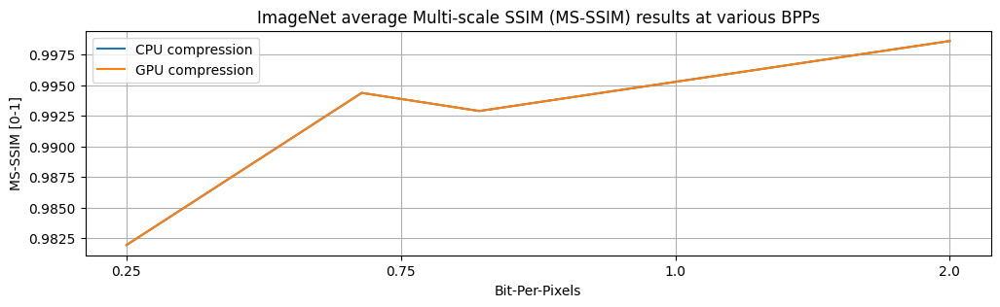

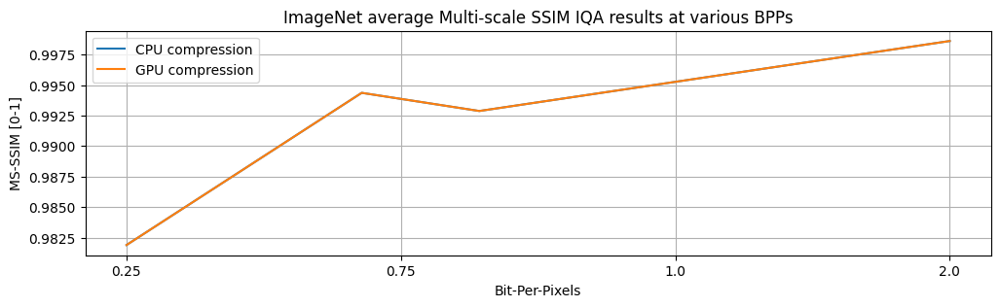

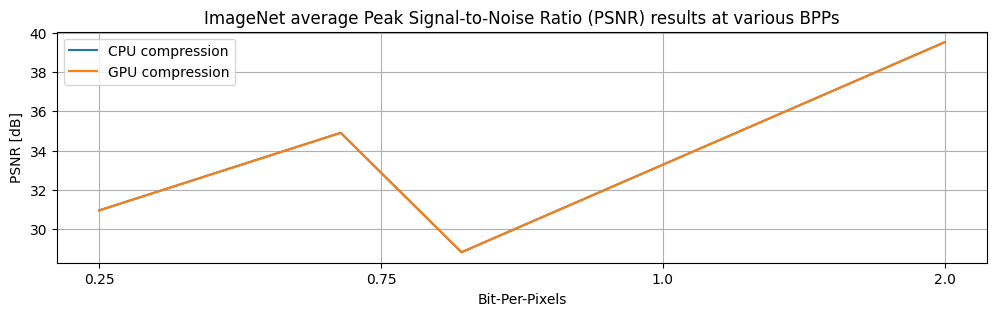

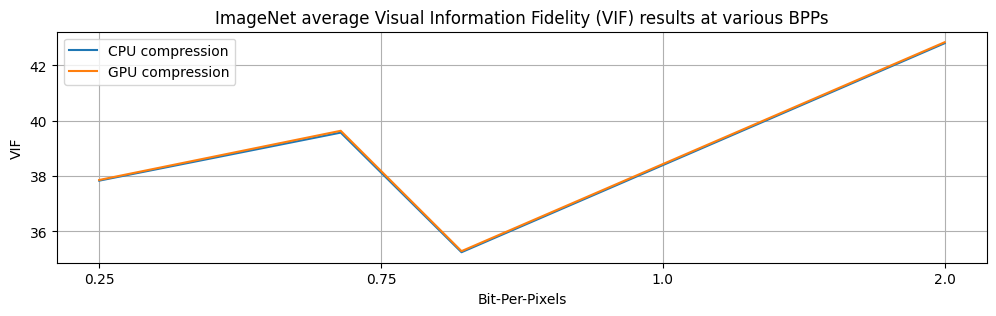

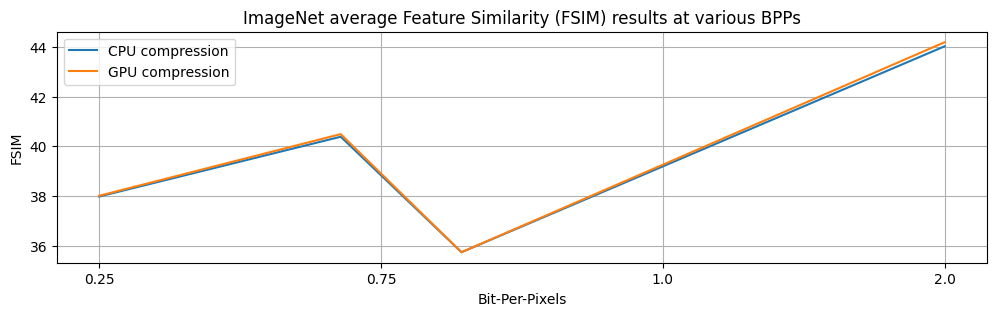

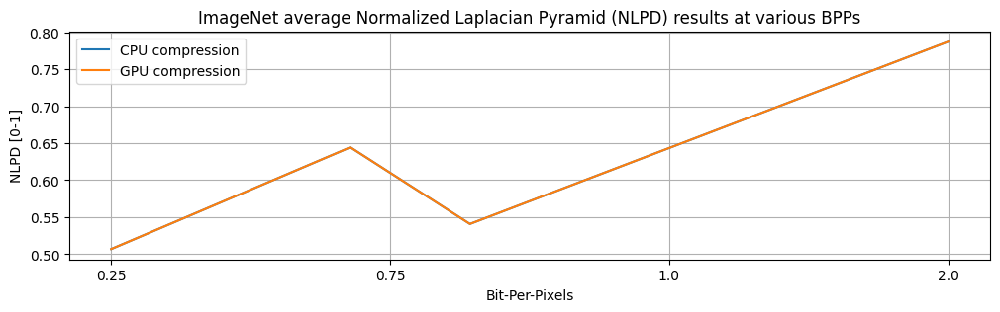

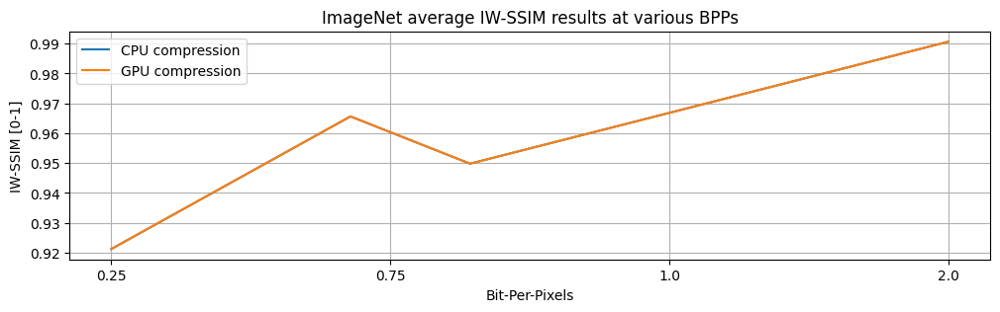

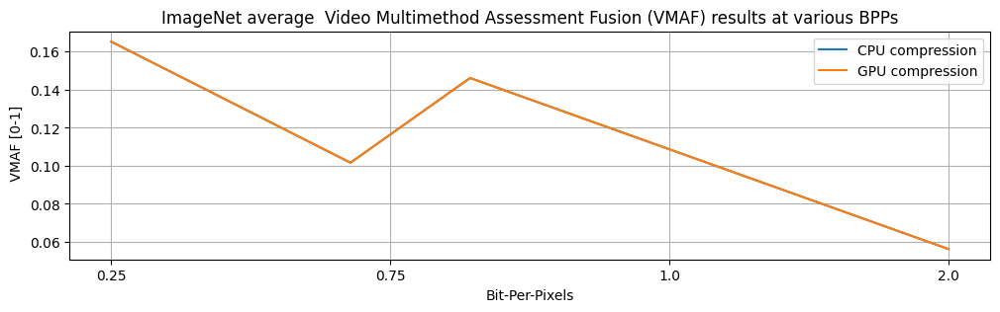

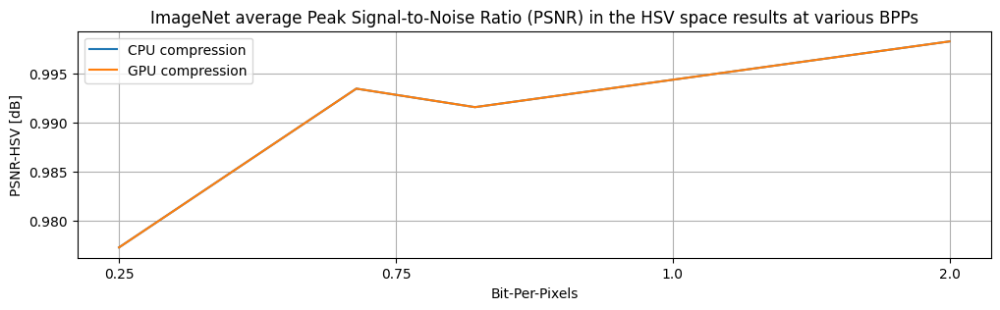

In [27]:
labels_dict = {'msssim_torch': 'Multi-scale SSIM (MS-SSIM)',
  'msssim_iqa': 'Multi-scale SSIM IQA',
  'psnr': 'Peak Signal-to-Noise Ratio (PSNR)',
  'vif': 'Visual Information Fidelity (VIF)',
  'fsim': 'Feature Similarity (FSIM)',
  'nlpd': 'Normalized Laplacian Pyramid (NLPD)',
  'iw-ssim': 'IW-SSIM',
  'vmaf': ' Video Multimethod Assessment Fusion (VMAF)',
  'psnr_hvs': 'Peak Signal-to-Noise Ratio (PSNR) in the HSV space'}

ylabel_dict = {'msssim_torch': 'MS-SSIM [0-1]',
  'msssim_iqa': 'MS-SSIM [0-1]',
  'psnr': 'PSNR [dB]',
  'vif': 'VIF',
  'fsim': 'FSIM',
  'nlpd': 'NLPD [0-1]',
  'iw-ssim': 'IW-SSIM [0-1]',
  'vmaf': ' VMAF [0-1]',
  'psnr_hvs': 'PSNR-HSV [dB]'}

# Let's plot the single metrics
for metric in metrics.metrics_output:
    fig, axs = plt.subplots(1, 1, figsize=(12, 3))
    cpu_metrics = all_dfs.loc['CPU compression'].groupby('Target BPP').mean()[metric]
    cpu_metrics.rename(lambda x: float(x.split('_')[-1])/100, axis=0, inplace=True)
    cpu_metrics.sort_index(inplace=True)
    gpu_metrics = all_dfs.loc['GPU compression'].groupby('Target BPP').mean()[metric]
    gpu_metrics.rename(lambda x: float(x.split('_')[-1])/100, axis=0, inplace=True)
    gpu_metrics.sort_index(inplace=True)
    axs.plot(cpu_metrics, label='CPU compression')
    axs.plot(gpu_metrics, label='GPU compression')
    plt.legend()
    plt.grid()
    plt.title(f'ImageNet average {labels_dict[metric]} results at various BPPs')
    plt.ylabel(ylabel_dict[metric])
    plt.xticks(ticks=np.linspace(gpu_metrics.index[0], gpu_metrics.index[-1], len(gpu_metrics.index)),
               labels=gpu_metrics.index.tolist())
    plt.xlabel('Bit-Per-Pixels')
    plt.show()

### Let's compare CPU and GPU compression directly

In [28]:
# Cycle over the various compressed samples
compare_device_df = all_dfs.loc['GPU compression'].copy()

for idx, r in tqdm(all_dfs.loc['GPU compression'].iterrows()):
    # Load the compressed sample
    data_r, _ = DataClass().load_image(r['path'], color_conv='709', device='cuda')
    # Load the uncompressed sample
    data_or, _ = DataClass().load_image(cpu_df.loc[idx[0]].loc[cpu_df.loc[idx[0], 'filename']==r['filename']]['path'].item(),
                                        color_conv='709', device='cuda')
    # Compute the metrics
    metrics_vals = metrics.process_images(data_or, data_r)
    metrics_vals = {metric: metrics_vals[idx] for idx, metric in enumerate(metrics.metrics_output)}
    # Add the metrics to the Dataframe
    for metric in metrics.metrics_output:
        compare_device_df.loc[idx, metric] = metrics_vals[metric]
    torch.cuda.empty_cache()

0it [00:00, ?it/s]

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


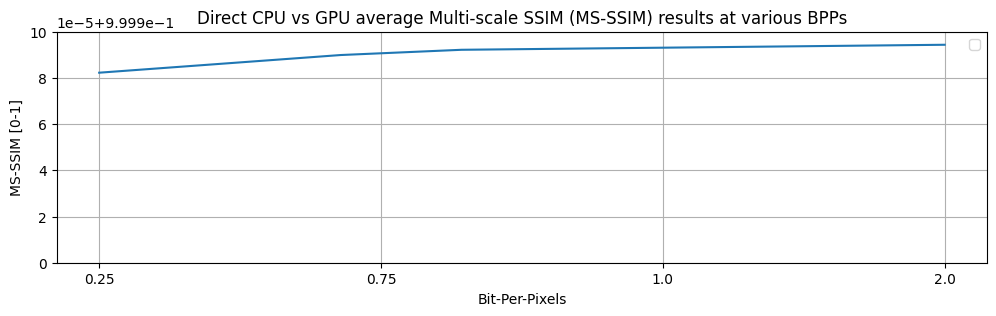

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


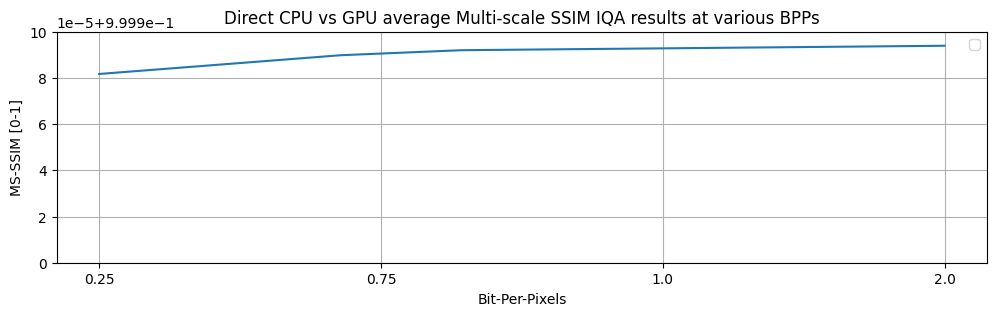

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


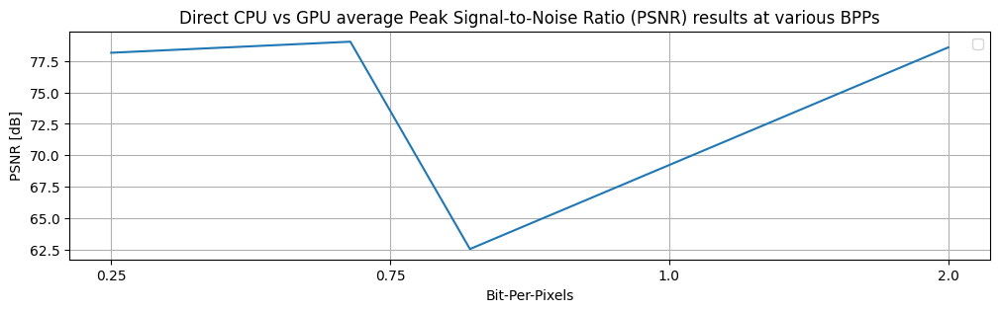

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


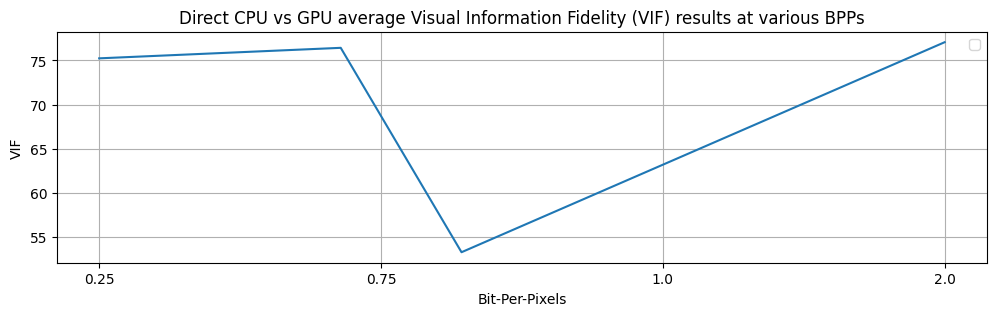

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


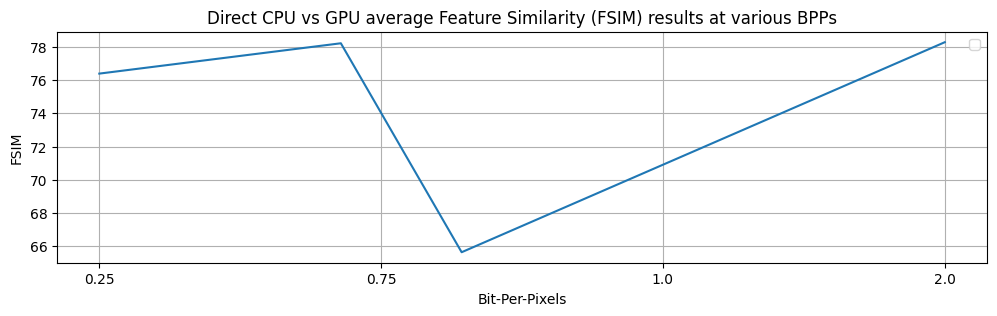

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


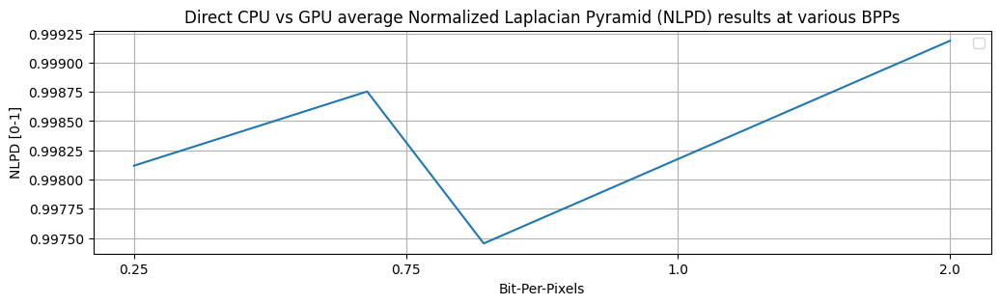

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


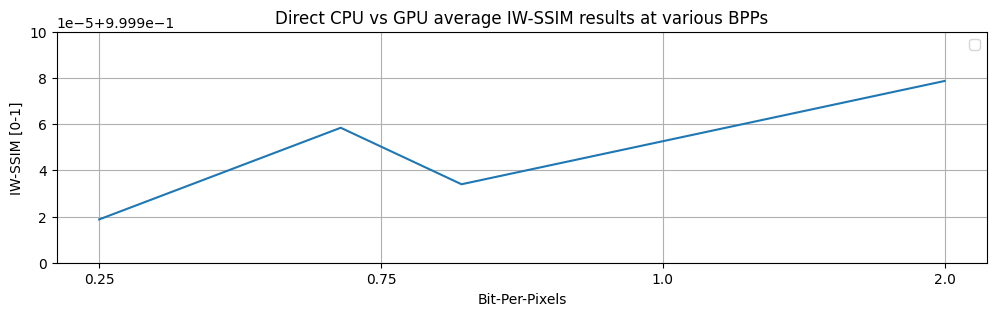

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


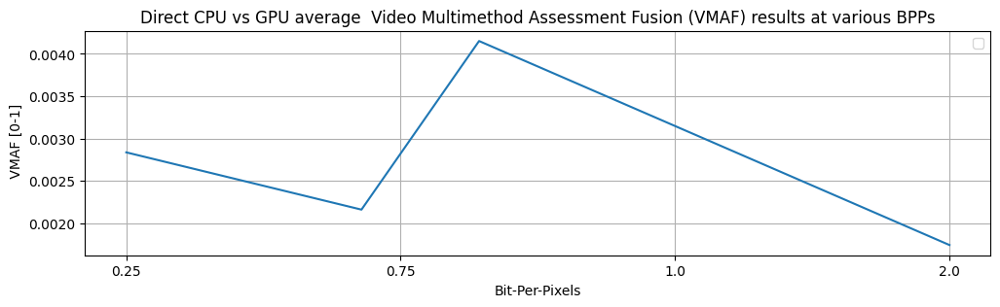

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


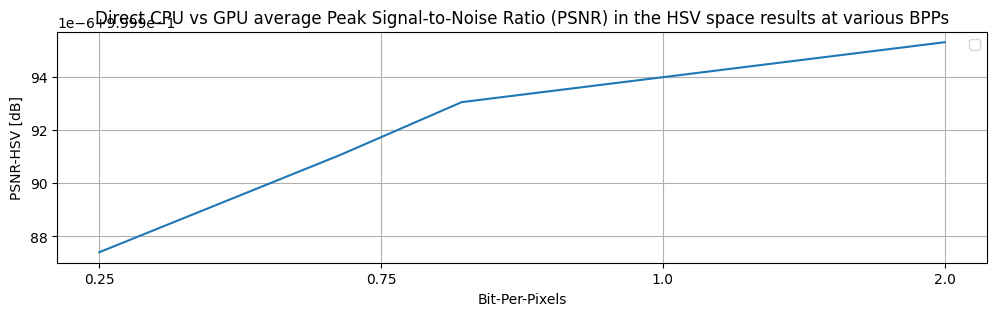

In [29]:
labels_dict = {'msssim_torch': 'Multi-scale SSIM (MS-SSIM)',
  'msssim_iqa': 'Multi-scale SSIM IQA',
  'psnr': 'Peak Signal-to-Noise Ratio (PSNR)',
  'vif': 'Visual Information Fidelity (VIF)',
  'fsim': 'Feature Similarity (FSIM)',
  'nlpd': 'Normalized Laplacian Pyramid (NLPD)',
  'iw-ssim': 'IW-SSIM',
  'vmaf': ' Video Multimethod Assessment Fusion (VMAF)',
  'psnr_hvs': 'Peak Signal-to-Noise Ratio (PSNR) in the HSV space'}

ylabel_dict = {'msssim_torch': 'MS-SSIM [0-1]',
  'msssim_iqa': 'MS-SSIM [0-1]',
  'psnr': 'PSNR [dB]',
  'vif': 'VIF',
  'fsim': 'FSIM',
  'nlpd': 'NLPD [0-1]',
  'iw-ssim': 'IW-SSIM [0-1]',
  'vmaf': ' VMAF [0-1]',
  'psnr_hvs': 'PSNR-HSV [dB]'}

# Let's plot the single metrics
for metric in metrics.metrics_output:
    fig, axs = plt.subplots(1, 1, figsize=(12, 3))
    cpu_metrics = compare_device_df.groupby('Target BPP').mean()[metric]
    cpu_metrics.rename(lambda x: float(x.split('_')[-1])/100, axis=0, inplace=True)
    cpu_metrics.sort_index(inplace=True)
    axs.plot(cpu_metrics)
    plt.legend()
    plt.grid()
    plt.title(f'Direct CPU vs GPU average {labels_dict[metric]} results at various BPPs')
    plt.ylabel(ylabel_dict[metric])
    if 'ssim' in metric:
        plt.ylim([0.9999, 1.0])
    plt.xticks(ticks=np.linspace(gpu_metrics.index[0], gpu_metrics.index[-1], len(gpu_metrics.index)),
               labels=gpu_metrics.index.tolist())
    plt.xlabel('Bit-Per-Pixels')
    plt.show()

### RAISE

In [30]:
rec_image_dir = '/nas/public/exchange/JPEG-AI/data/TEST/CPU_vs_GPU/raise'
or_image_dir = '/nas/public/exchange/JPEG-AI/data/TEST/raise/original'

In [31]:
# --- Create a dataframe for all info
all_dfs = []
all_target_bpps = os.listdir(os.path.join(rec_image_dir, 'compressed_CPU'))[1:]

# --- Find GPU-compressed samples
gpu_df = []
for target_bpp in all_target_bpps:
    all_bpp_images = glob.glob(os.path.join(rec_image_dir, 'compressed_GPU', target_bpp, '*.png'))
    print(f'We have {len(all_bpp_images)} for {target_bpp}')
    df = pd.DataFrame(all_bpp_images, columns=['path'])
    df = pd.concat({target_bpp: df}, names=['Target BPP'])
    df['filename'] = df['path'].apply(lambda x: os.path.basename(x))
    gpu_df.append(df)
gpu_df = pd.concat(gpu_df)
all_dfs.append(pd.concat({'GPU compression': gpu_df}, names=['Device']))

# --- Find CPU-compressed samples
cpu_df = []
for target_bpp in all_target_bpps:
    all_bpp_images = glob.glob(os.path.join(rec_image_dir, 'compressed_CPU', target_bpp, '*.png'))
    print(f'We have {len(all_bpp_images)} for {target_bpp}')
    df = pd.DataFrame(all_bpp_images, columns=['path'])
    df = pd.concat({target_bpp: df}, names=['Target BPP'])
    df['filename'] = df['path'].apply(lambda x: os.path.basename(x))
    # Keep only those entries which are present also in the GPU case
    df = df[df['filename'].isin(gpu_df.loc[target_bpp, 'filename'])]
    cpu_df.append(df)
cpu_df = pd.concat(cpu_df)
all_dfs.append(pd.concat({'CPU compression': cpu_df}, names=['Device']))

# --- Concat everything
all_dfs = pd.concat(all_dfs)
all_dfs

We have 0 for target_bpp_25
We have 3 for target_bpp_25


KeyError: 'target_bpp_25'